# Sparse Reconstruction (LASSO)

In [1]:
import os
import numpy as np
import torch
from torch import nn
from torchvision import transforms
from torchvision.ops.boxes import box_iou
import matplotlib.pyplot as plt
from PIL import Image
import cv2

In [2]:
TYPES = ['Pedestrian', 'Cyclist', 'Pets']
CARRY_ONS = ['backpack', 'shoulder-bag', 'hand-bag', 'luggage', 'umbrella', 'misc']

In [3]:
def idof(y):
    return y[0]

def typeof(y):
    return TYPES[y[1]]

def is_occluded(y):
    return y[2] == 1

def carry_ons(y):
    c = y[3:]
    return ', '.join([CARRY_ONS[i] for i in range(len(c)) if c[i] == 1])

## Sklearn

In [4]:
from sklearn.decomposition import SparseCoder

### ViaCrops

In [7]:
root = 'PennFudanPed/ViaCrops/'

D = np.load(root + 'train_dict.npy')
y = np.load(root + 'test_dict.npy')
Dl = np.load(root + 'train_labels.npy')
yl = np.load(root + 'test_labels.npy')

D.shape, y.shape, Dl.shape, yl.shape

((434, 128, 64), (100, 128, 64), (434, 9), (100, 9))

In [8]:
dim = 128 * 64
coder = SparseCoder(
     dictionary=D.reshape(-1, dim), transform_algorithm='lasso_lars',
     transform_alpha=1e0,
)

In [9]:
x = coder.transform(y.reshape(-1, dim))
x.shape

(100, 434)

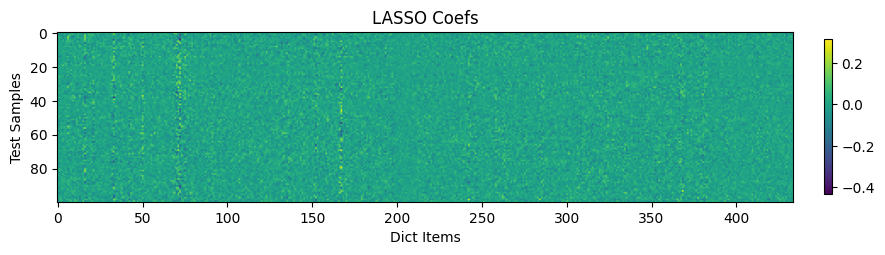

In [17]:
plt.figure(figsize=(10, 4))
im = plt.imshow(x)
plt.xlabel('Dict Items')
plt.ylabel('Test Samples')
plt.title('LASSO Coefs')
plt.colorbar(im, fraction=0.010, pad=0.04)

In [11]:
def sci(x):
    # x -> [n, k]
    k = x.shape[1]
    l1 = np.linalg.norm(x, ord=1, axis=1)
    return (k * np.max(np.abs(x), axis=1) / l1 - 1) / (k - 1)

Text(0, 0.5, 'SCI')

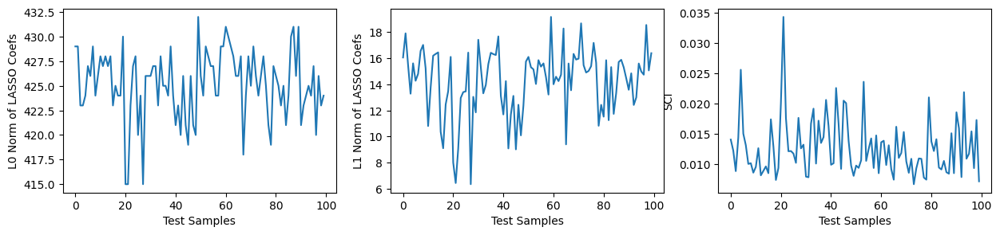

In [12]:
l0 = np.linalg.norm(x, ord=0, axis=1)
l1 = np.linalg.norm(x, ord=1, axis=1)
s = sci(x)

fig, ax = plt.subplots(1, 3, figsize=(15, 3))

ax[0].plot(l0)
ax[0].set_xlabel('Test Samples')
ax[0].set_ylabel('L0 Norm of LASSO Coefs')
ax[1].plot(l1)
ax[1].set_xlabel('Test Samples')
ax[1].set_ylabel('L1 Norm of LASSO Coefs')
ax[2].plot(s)
ax[2].set_xlabel('Test Samples')
ax[2].set_ylabel('SCI')

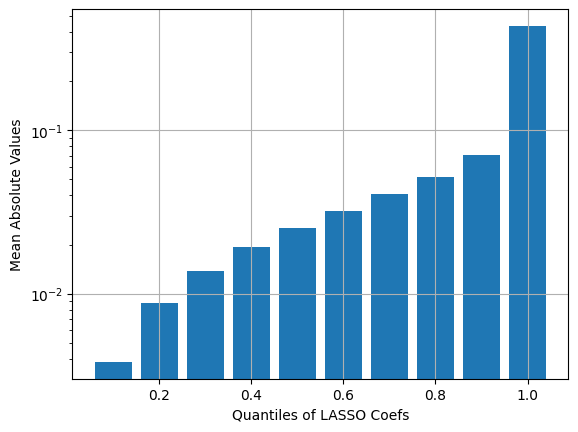

In [13]:
qs = np.arange(0.1, 1.1, 0.1)
c = []
for q in qs:
    c.append(np.quantile(np.abs(x), q))
plt.bar(qs, c, width=0.08)
plt.yscale('log')
plt.xlabel('Quantiles of LASSO Coefs')
plt.ylabel('Mean Absolute Values')
plt.grid('on')

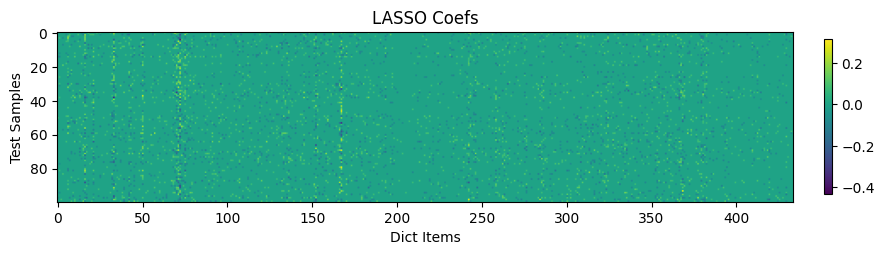

In [15]:
plt.figure(figsize=(10, 4))
xs = np.where(np.abs(x) > c[-2], x, 0)
im = plt.imshow(xs)
plt.xlabel('Dict Items')
plt.ylabel('Test Samples')
plt.title('LASSO Coefs')
plt.colorbar(im, fraction=0.01, pad=0.04)

Text(0, 0.5, 'SCI')

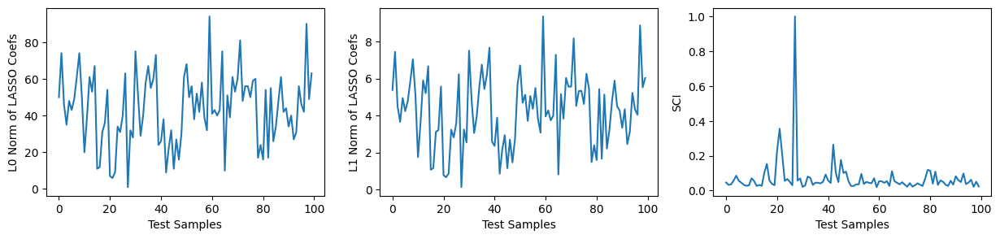

In [18]:
l0 = np.linalg.norm(xs, ord=0, axis=1)
l1 = np.linalg.norm(xs, ord=1, axis=1)
ss = sci(xs)

fig, ax = plt.subplots(1, 3, figsize=(15, 3))

ax[0].plot(l0)
ax[0].set_xlabel('Test Samples')
ax[0].set_ylabel('L0 Norm of LASSO Coefs')
ax[1].plot(l1)
ax[1].set_xlabel('Test Samples')
ax[1].set_ylabel('L1 Norm of LASSO Coefs')
ax[2].plot(ss)
ax[2].set_xlabel('Test Samples')
ax[2].set_ylabel('SCI')

In [119]:
def show_topk(i, k):
    ids = np.argsort(np.abs(x[i]))[::-1][:k]
    title = '{}{} ({})\n{}'.format(
        typeof(yl[i]), idof(yl[i]), 'OCC' if is_occluded(yl[i]) else 'NOC',
        'carry-on: ' + carry_ons(yl[i])
    )
    r = 2
    c = (k + 1) // 2
    fig, ax = plt.subplots(r, c, figsize=(c*3, 9))
    ax[0][0].imshow(y[i].reshape(*D.shape[-2:]))
    ax[0][0].axis('off')
    ax[0][0].set_title(title + '\nSCI = {:.3f}'.format(ss[i]))
    for j, ii in enumerate(ids):
        title = '{}{} ({})\n{}'.format(
            typeof(Dl[ii]), idof(Dl[ii]), 'OCC' if is_occluded(Dl[ii]) else 'NOC',
            'carry-on: ' + carry_ons(Dl[ii])
        )
        ax[(j+1)//c][(j+1)%c].imshow(D[ii].reshape(*D.shape[-2:]))
        ax[(j+1)//c][(j+1)%c].axis('off')
        ax[(j+1)//c][(j+1)%c].set_title(title + '\nCoef = {:.3f}'.format(x[i, ii]))

In [120]:
ids = np.argsort(ss)[-5:]
ids, l1[ids], l0[ids], ss[ids]

(array([22, 20, 42, 21, 27]),
 array([0.86796454, 0.77763131, 0.85225623, 0.66071716, 0.12677251]),
 array([9., 7., 9., 6., 1.]),
 array([0.20675965, 0.22933845, 0.26367919, 0.35540305, 1.        ]))

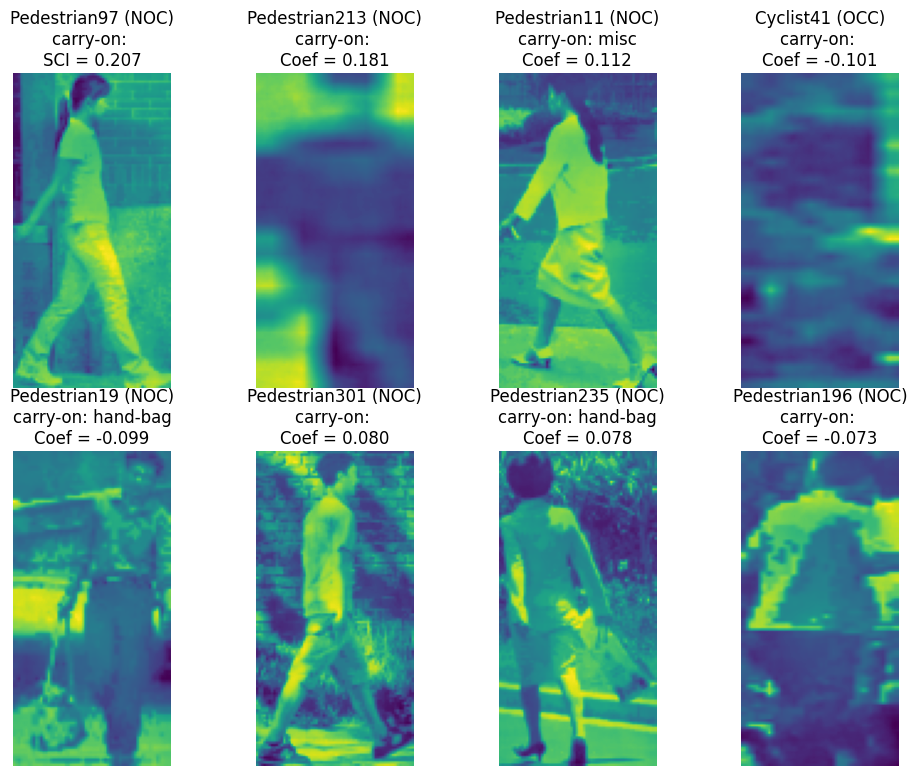

In [121]:
show_topk(22, k=7)

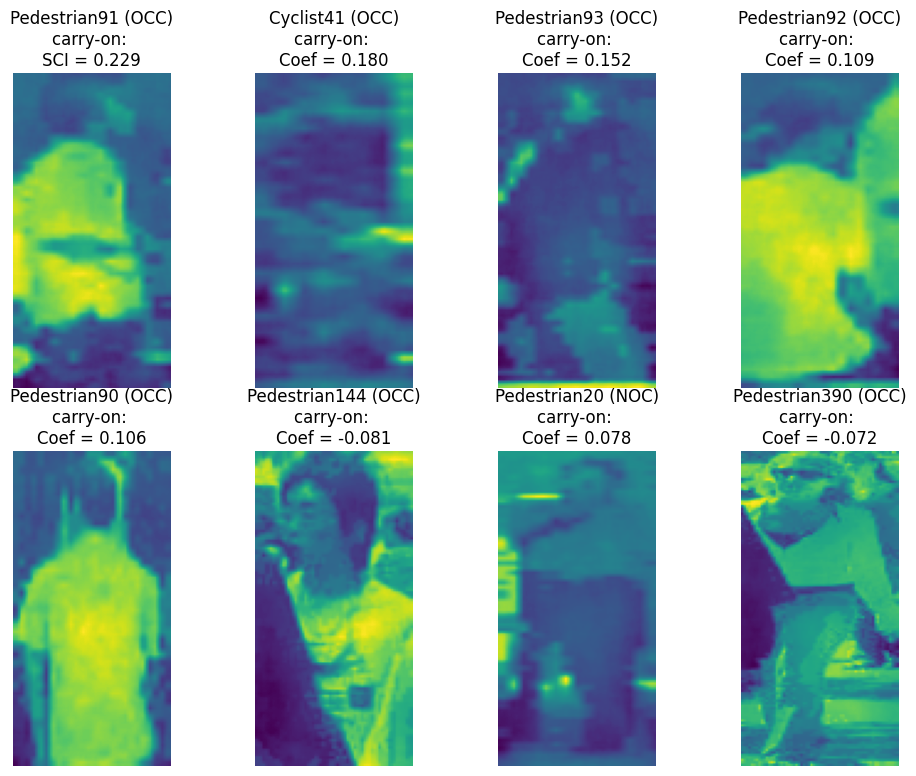

In [122]:
show_topk(20, k=7)

In [123]:
ids = np.argsort(ss)[:5]
ids, l1[ids], l0[ids], ss[ids]

(array([59, 30, 97, 71, 73]),
 array([9.35442194, 7.50394832, 8.87231853, 8.16767721, 5.32012449]),
 array([94., 75., 90., 81., 56.]),
 array([0.01992257, 0.02156446, 0.02212544, 0.02264697, 0.02301191]))

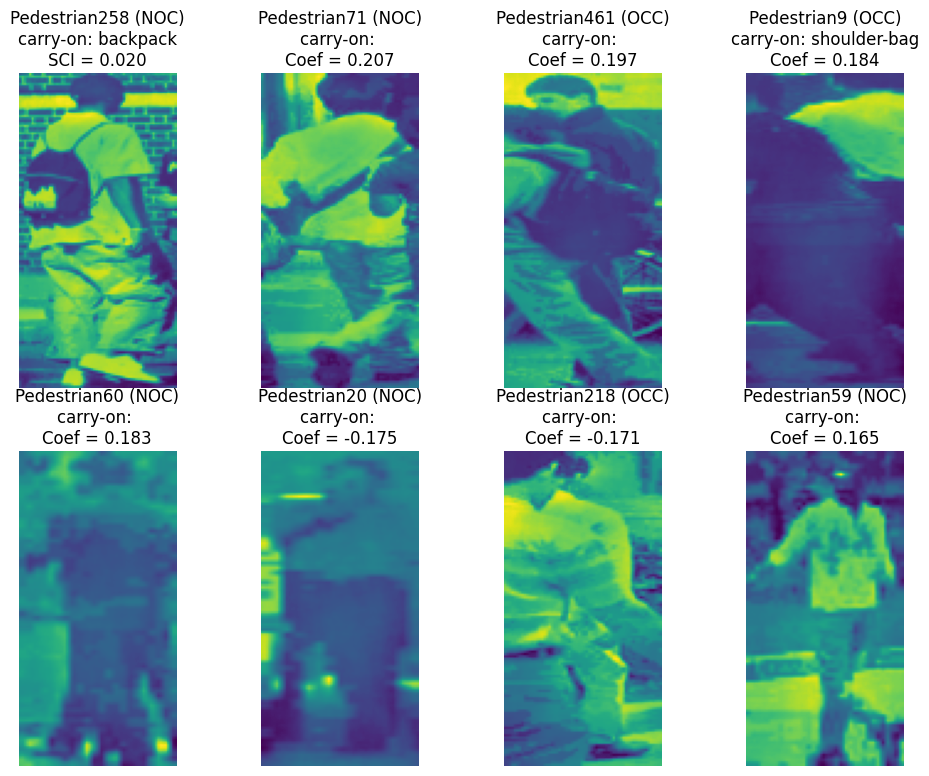

In [124]:
show_topk(59, k=7)

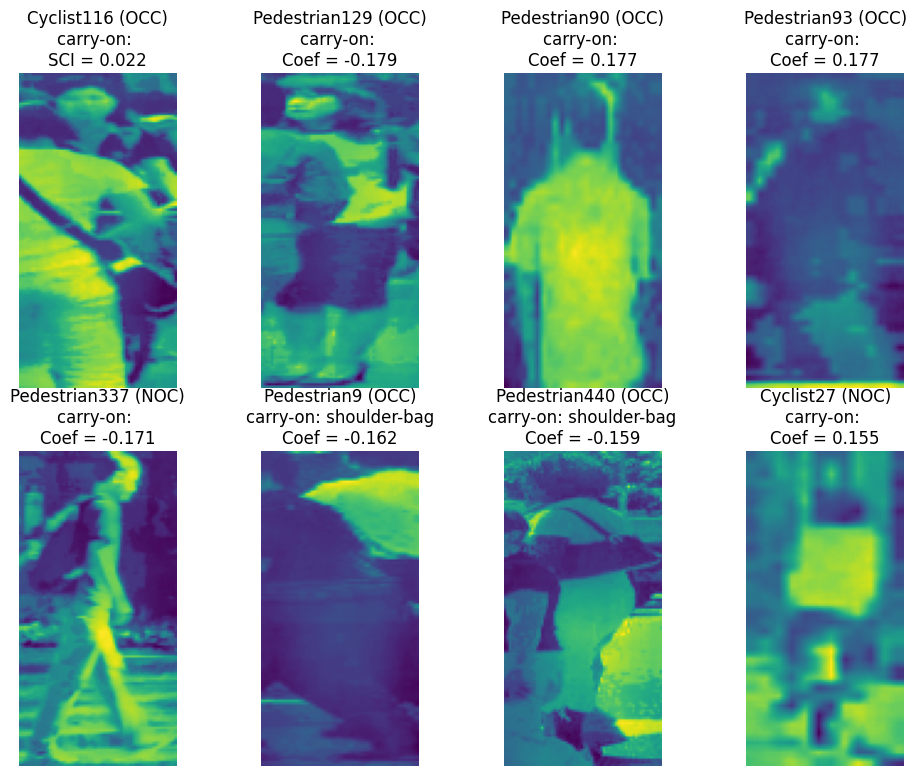

In [125]:
show_topk(30, k=7)

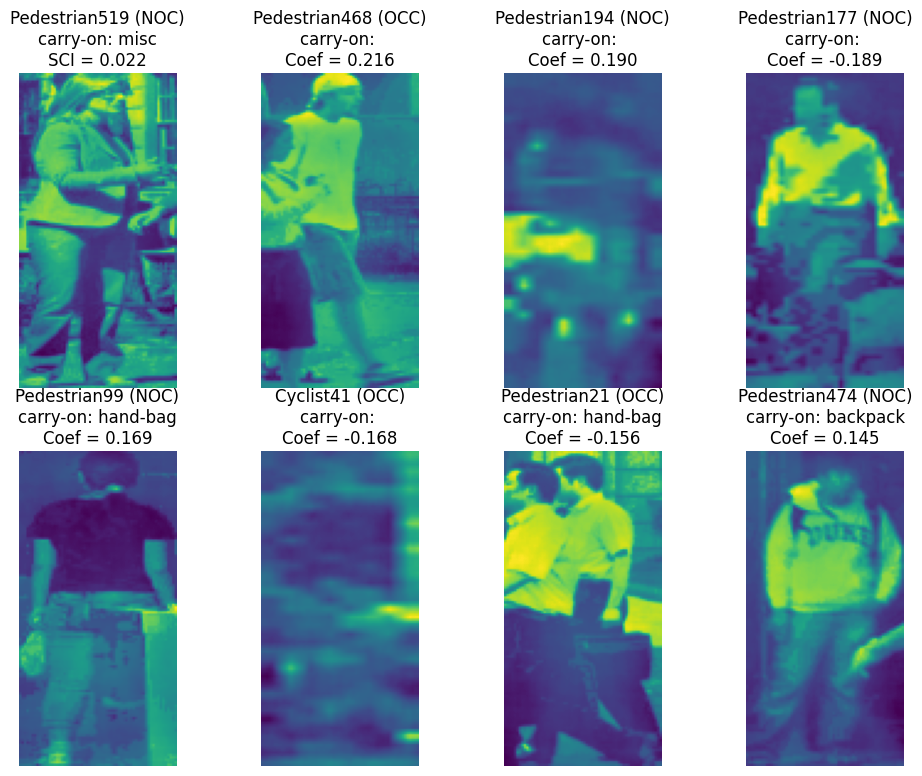

In [126]:
show_topk(97, k=7)

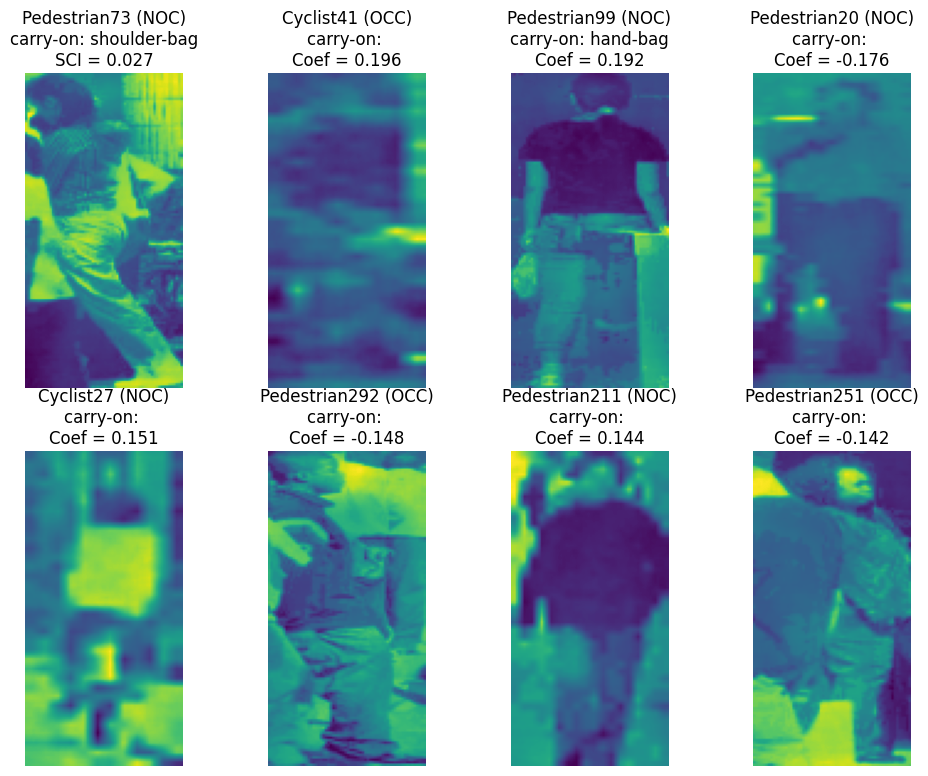

In [127]:
show_topk(14, k=7)

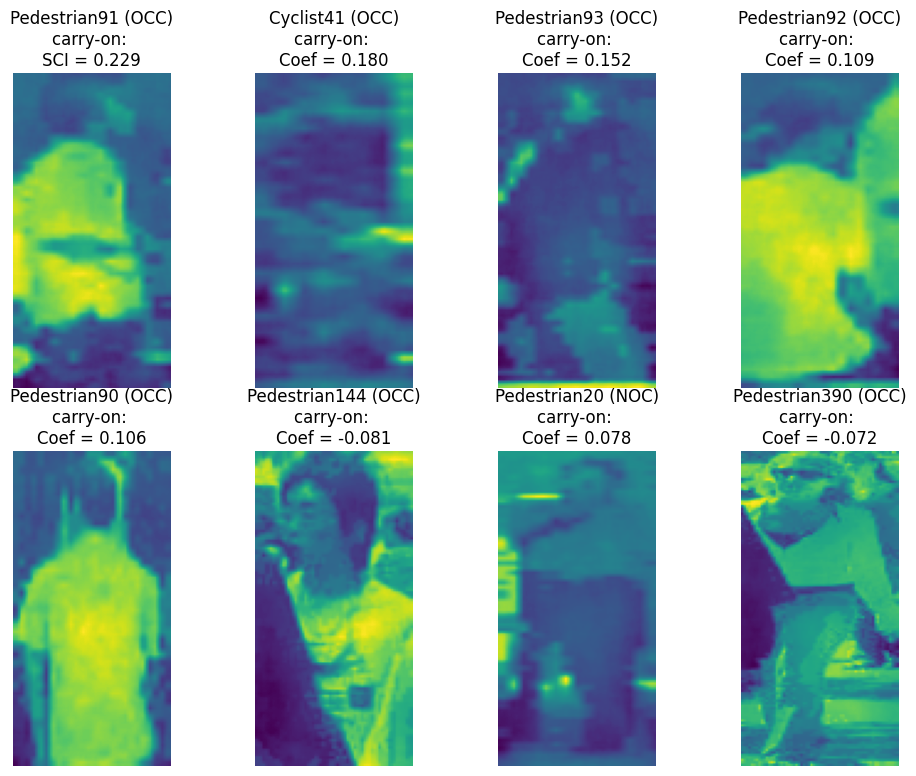

In [128]:
show_topk(20, k=7)

## Predict

### Predicting Types

In [150]:
import pandas as pd
pd.Series(Dl[:, 1]).value_counts()

0    413
1     20
2      1
Name: count, dtype: int64

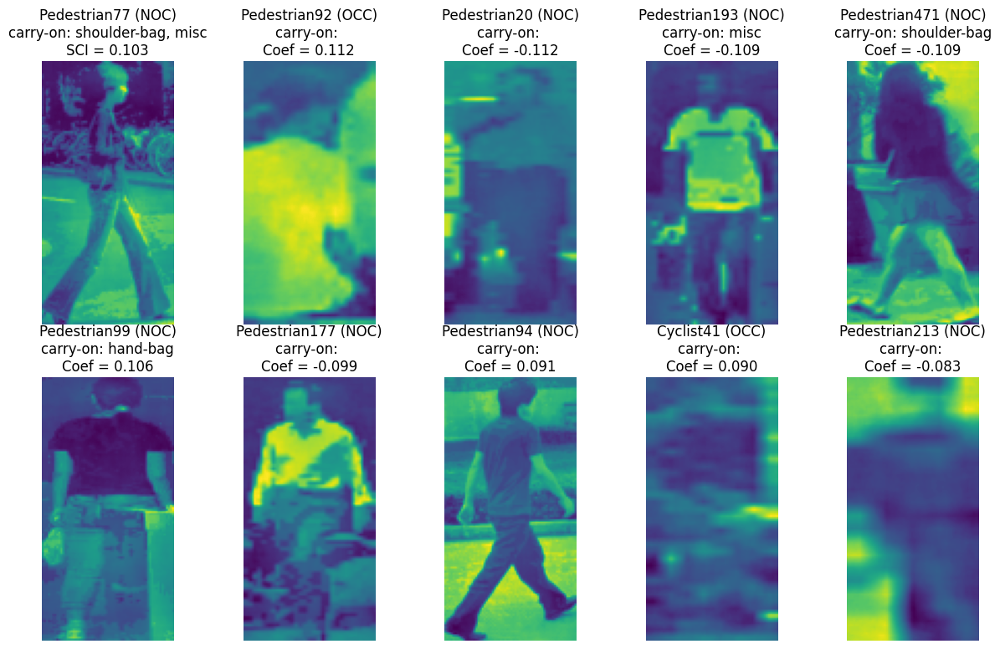

In [129]:
show_topk(15, k=9)

In [130]:
def sigmoid(x):
    return 1/(1 + np.exp(-x))

def softmax(x):
    s = np.exp(x)
    return s / np.sum(s, axis=-1)

def onehot(x, k):
    # x [n]
    x = np.array(x).astype(int)
    if len(x.shape) == 0:
        ret = np.zeros(k)
        ret[x] = 1
    else:
        ret = np.zeros(x.shape[0], k)
        ret[:, x] = 1
    return ret

def crossentropy(p, y):
    # p, y -> [n, k]
    eps = 1e-8
    ret = - np.sum(y * np.log(p + eps))
    if len(y.shape) > 0: ret /= y.shape[0]
    return ret

In [153]:
def predict_type(i, k):
    # Dl -> [n_train, 9]
    # xi -> [n_train]
    xi = np.abs(x[i])
    ids = np.argsort(xi)[-k:]
    xi = xi[ids]
    xi /= np.sum(xi)
    pt = np.zeros(len(TYPES))
    for j in range(len(TYPES)):
        m = Dl[ids, 1] == j
        pt[j] = np.sum(xi[m])
    return pt

i = 15
k = 10
gt = yl[i, 1]
pr = predict_type(i, k)
gt, pr, crossentropy(pr, onehot(gt, len(TYPES)))

(0, array([0.90924309, 0.09075691, 0.        ]), 0.031714262317648456)

**Missing all cyclists**

Type detection F1 score: 0.9701010101010101


array([[98,  0],
       [ 2,  0]])

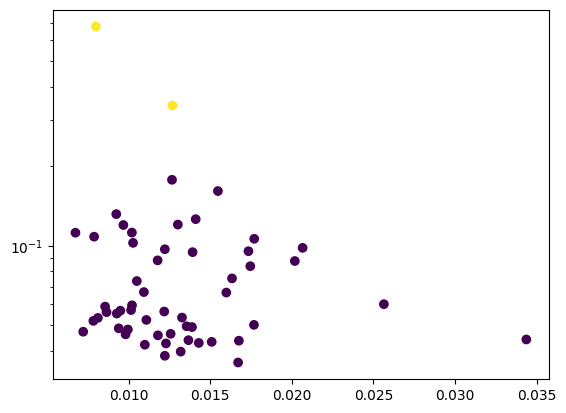

In [156]:
from sklearn.metrics import f1_score, confusion_matrix

prs = []
gts = []
ces = []
scis = sci(x)

for i in range(len(yl)):
    gt = yl[i, 1]
    pr = predict_type(i, k=7)
    prs.append(np.argmax(pr))
    gts.append(gt)
    ces.append(crossentropy(pr, onehot(gt, len(TYPES))))

plt.scatter(scis, ces, c=gts)
plt.yscale('log')
print('Type detection F1 score:', f1_score(gts, prs, average='weighted'))
confusion_matrix(gts, prs)

### Predicting Occlusions

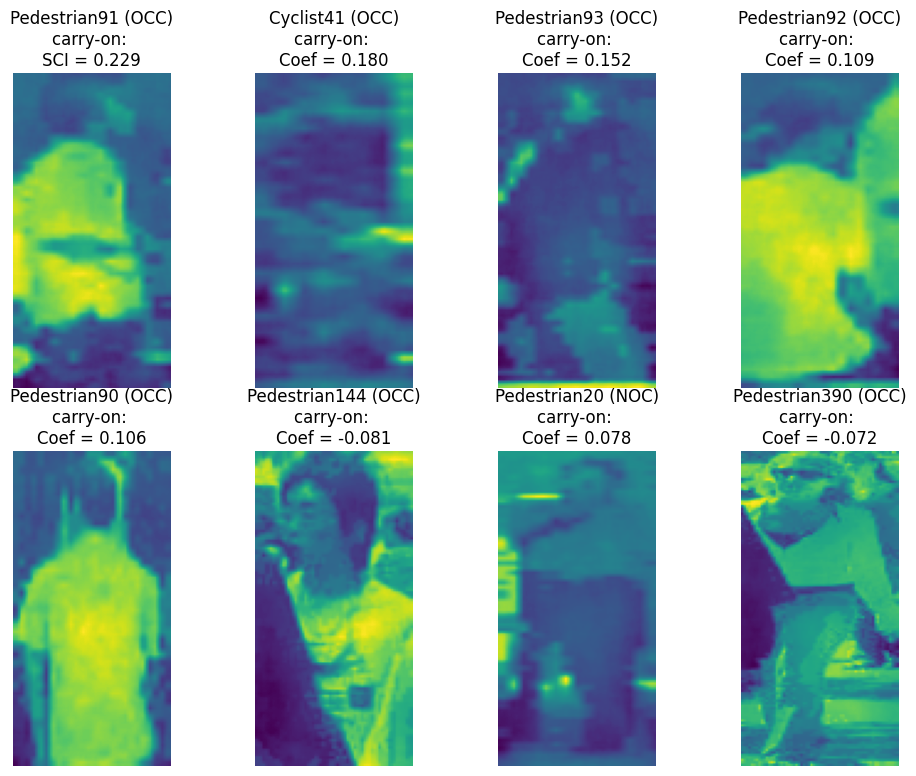

In [151]:
show_topk(20, 7)

In [111]:
def predict_occ(i, k):
    # Dl -> [n_train, 9]
    # xi -> [n_train]
    xi = np.abs(x[i])
    ids = np.argsort(xi)[::-1][:k]
    xi = xi[ids]
    print(Dl[ids, 2], ids)
    occ = np.sum(Dl[ids, 2] * xi)
    return occ# / np.sum(xi)

i = 20
k = 10
gt = yl[i, 2]
pr = predict_occ(i, k)
gt, pr, crossentropy(pr, gt)

[1 1 1 1 1 0 1 0 0 0] [ 33  72  71  70 109  16 310 152  77 376]


(1, 0.6995845995929315, 0.35726853494626165)

Type detection F1 score: 0.6692397660818713


array([[67,  5],
       [23,  5]])

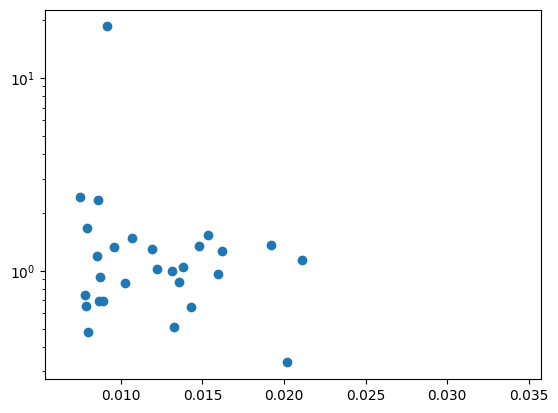

In [103]:
from sklearn.metrics import f1_score, confusion_matrix

prs = []
gts = []
ces = []
scis = sci(x)

for i in range(len(yl)):
    gt = yl[i, 2]
    pr = predict_occ(i, k=10)
    prs.append(np.round(pr))
    gts.append(gt)
    ces.append(crossentropy(pr, gt))

plt.scatter(scis, ces)
plt.yscale('log')
print('Type detection F1 score:', f1_score(gts, prs, average='weighted'))
confusion_matrix(gts, prs)

### ViaCrops Patches

In [256]:
root = 'PennFudanPed/ViaCrops/'

D = np.load(root + 'train_dict.npy')
y = np.load(root + 'test_dict.npy')
Dl = np.load(root + 'train_labels.npy')
yl = np.load(root + 'test_labels.npy')

D.shape, y.shape, Dl.shape, yl.shape

((434, 128, 64), (100, 128, 64), (434, 9), (100, 9))

In [286]:
from skimage.util import view_as_blocks

s = 64

Dp = []
for i in range(len(D)):
    Dp.append(view_as_blocks(D[i], (s, s)).reshape(-1, s, s))

yp = []
for i in range(len(y)):
    yp.append(view_as_blocks(y[i], (s, s)).reshape(-1, s, s))

Dp = np.vstack(Dp)
yp = np.vstack(yp)
Dp.shape, yp.shape

((868, 64, 64), (200, 64, 64))

In [287]:
dim = s * s
coder = SparseCoder(
     dictionary=Dp.reshape(-1, dim), transform_algorithm='lasso_lars',
     transform_alpha=1e0,
)

In [288]:
x = coder.transform(yp.reshape(-1, dim))
x.shape

(200, 868)

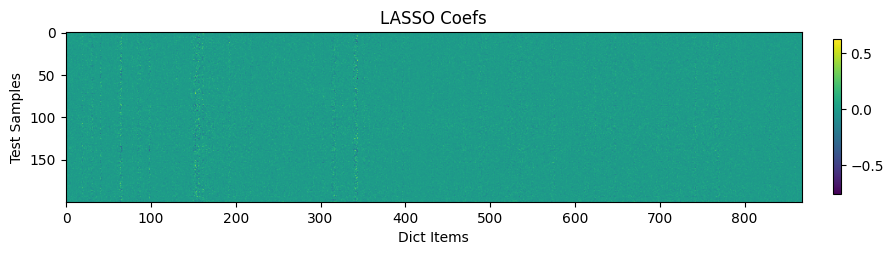

In [289]:
plt.figure(figsize=(10, 4))
im = plt.imshow(x)
plt.xlabel('Dict Items')
plt.ylabel('Test Samples')
plt.title('LASSO Coefs')
plt.colorbar(im, fraction=0.01, pad=0.04)

Text(0, 0.5, 'SCI')

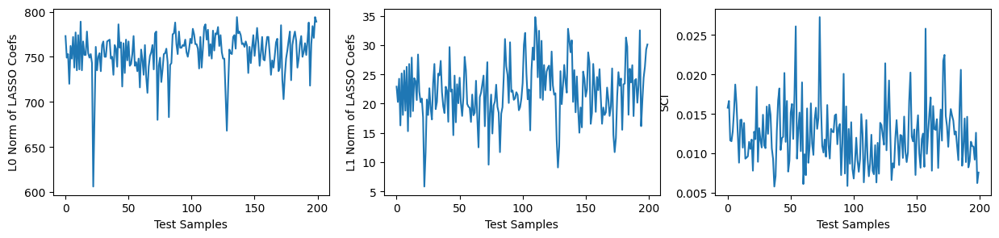

In [290]:
l0 = np.linalg.norm(x, ord=0, axis=1)
l1 = np.linalg.norm(x, ord=1, axis=1)
s = sci(x)

fig, ax = plt.subplots(1, 3, figsize=(15, 3))

ax[0].plot(l0)
ax[0].set_xlabel('Test Samples')
ax[0].set_ylabel('L0 Norm of LASSO Coefs')
ax[1].plot(l1)
ax[1].set_xlabel('Test Samples')
ax[1].set_ylabel('L1 Norm of LASSO Coefs')
ax[2].plot(s)
ax[2].set_xlabel('Test Samples')
ax[2].set_ylabel('SCI')

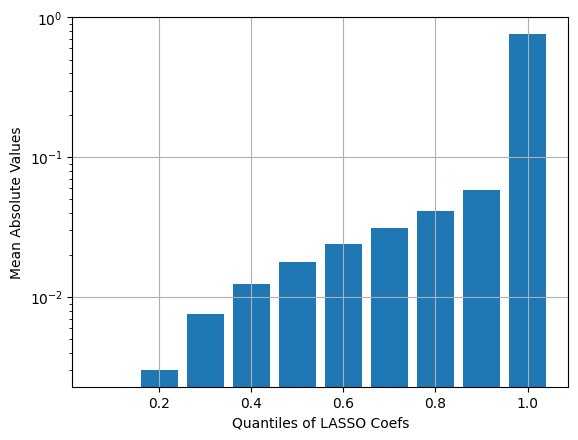

In [291]:
qs = np.arange(0.1, 1.1, 0.1)
c = []
for q in qs:
    c.append(np.quantile(np.abs(x), q))
plt.bar(qs, c, width=0.08)
plt.yscale('log')
plt.xlabel('Quantiles of LASSO Coefs')
plt.ylabel('Mean Absolute Values')
plt.grid('on')

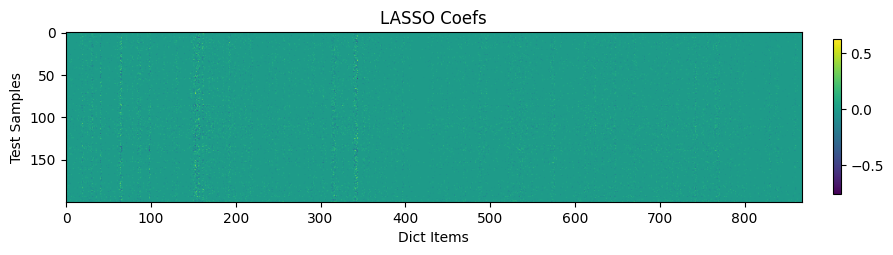

In [292]:
plt.figure(figsize=(10, 4))
xs = np.where(np.abs(x) > c[-2], x, 0)
im = plt.imshow(xs)
plt.xlabel('Dict Items')
plt.ylabel('Test Samples')
plt.title('LASSO Coefs')
plt.colorbar(im, fraction=0.01, pad=0.04)

Text(0, 0.5, 'SCI')

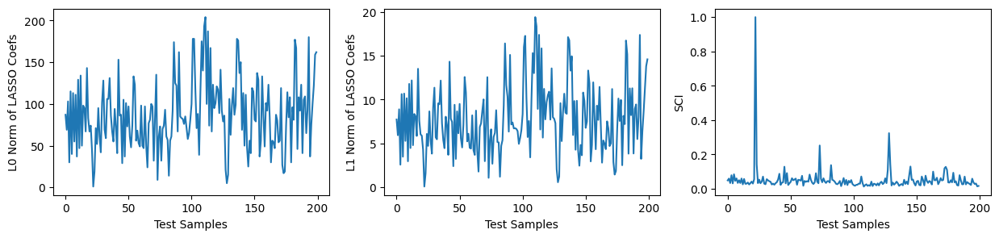

In [293]:
l0 = np.linalg.norm(xs, ord=0, axis=1)
l1 = np.linalg.norm(xs, ord=1, axis=1)
ss = sci(xs)

fig, ax = plt.subplots(1, 3, figsize=(15, 3))

ax[0].plot(l0)
ax[0].set_xlabel('Test Samples')
ax[0].set_ylabel('L0 Norm of LASSO Coefs')
ax[1].plot(l1)
ax[1].set_xlabel('Test Samples')
ax[1].set_ylabel('L1 Norm of LASSO Coefs')
ax[2].plot(ss)
ax[2].set_xlabel('Test Samples')
ax[2].set_ylabel('SCI')

In [119]:
def show_topk(i, k):
    ids = np.argsort(np.abs(x[i]))[::-1][:k]
    title = '{}{} ({})\n{}'.format(
        typeof(yl[i]), idof(yl[i]), 'OCC' if is_occluded(yl[i]) else 'NOC',
        'carry-on: ' + carry_ons(yl[i])
    )
    r = 2
    c = (k + 1) // 2
    fig, ax = plt.subplots(r, c, figsize=(c*3, 9))
    ax[0][0].imshow(y[i].reshape(*D.shape[-2:]))
    ax[0][0].axis('off')
    ax[0][0].set_title(title + '\nSCI = {:.3f}'.format(ss[i]))
    for j, ii in enumerate(ids):
        title = '{}{} ({})\n{}'.format(
            typeof(Dl[ii]), idof(Dl[ii]), 'OCC' if is_occluded(Dl[ii]) else 'NOC',
            'carry-on: ' + carry_ons(Dl[ii])
        )
        ax[(j+1)//c][(j+1)%c].imshow(D[ii].reshape(*D.shape[-2:]))
        ax[(j+1)//c][(j+1)%c].axis('off')
        ax[(j+1)//c][(j+1)%c].set_title(title + '\nCoef = {:.3f}'.format(x[i, ii]))

In [245]:
ids = np.argsort(ss)[-5:]
ids, l1[ids], l0[ids], ss[ids]

(array([109,  32,  68,  31, 132]),
 array([0.89125751, 0.89141185, 1.24946717, 0.98821679, 0.85619597]),
 array([8., 5., 7., 5., 5.]),
 array([0.33006003, 0.33408911, 0.33415579, 0.43470532, 0.46294099]))

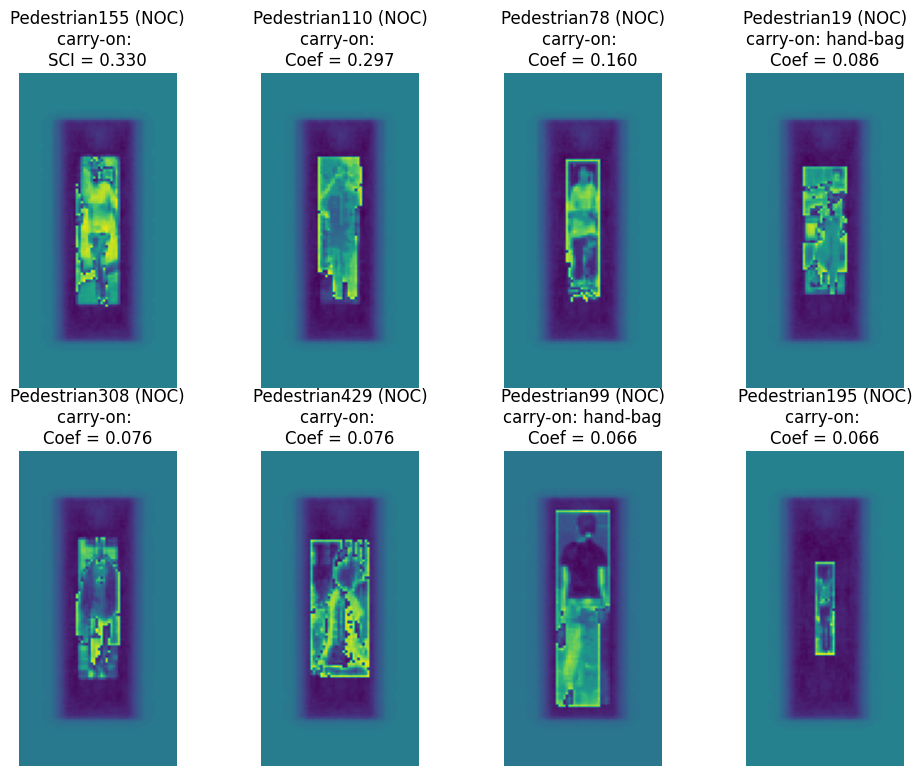

In [246]:
show_topk(109, k=7)

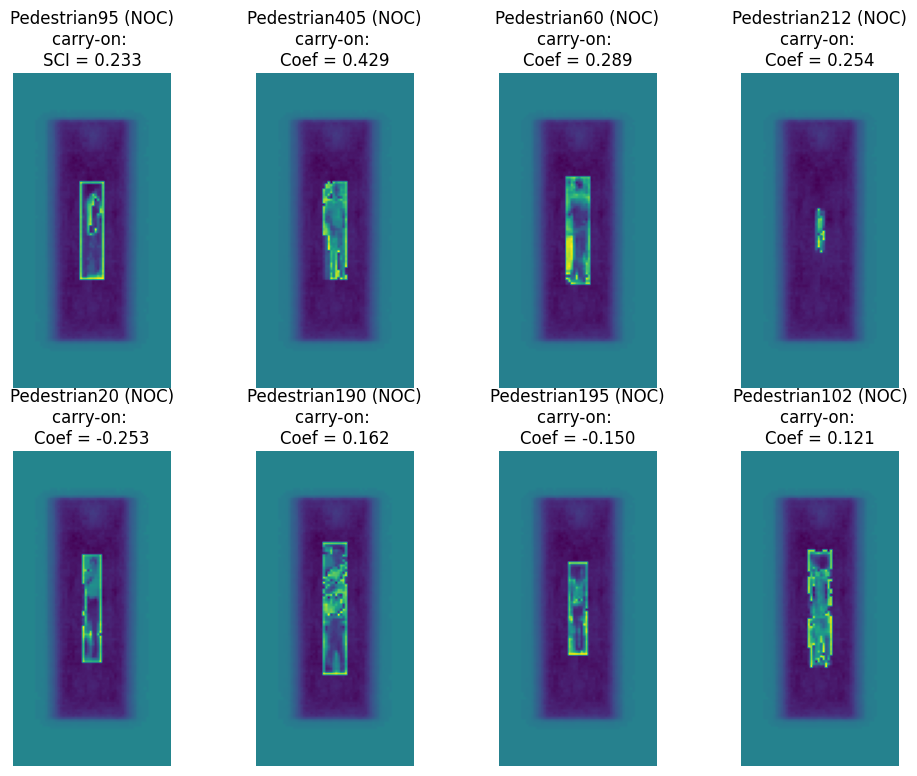

In [247]:
show_topk(66, k=7)

In [201]:
ids = np.argsort(ss)[:5]
ids, l1[ids], l0[ids], ss[ids]

(array([213, 114, 196,  37, 205]),
 array([6.79983314, 4.02340416, 5.03318066, 3.65842423, 3.98191114]),
 array([48., 32., 39., 30., 32.]),
 array([0.03286188, 0.03493086, 0.03695601, 0.03792015, 0.03928122]))

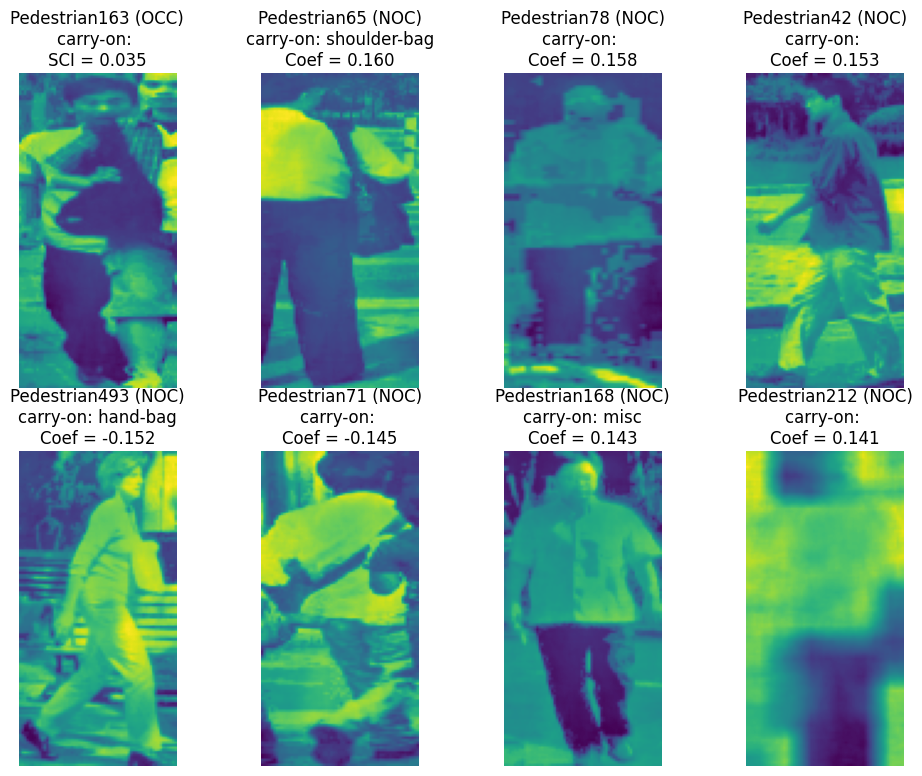

In [202]:
show_topk(114, k=7)

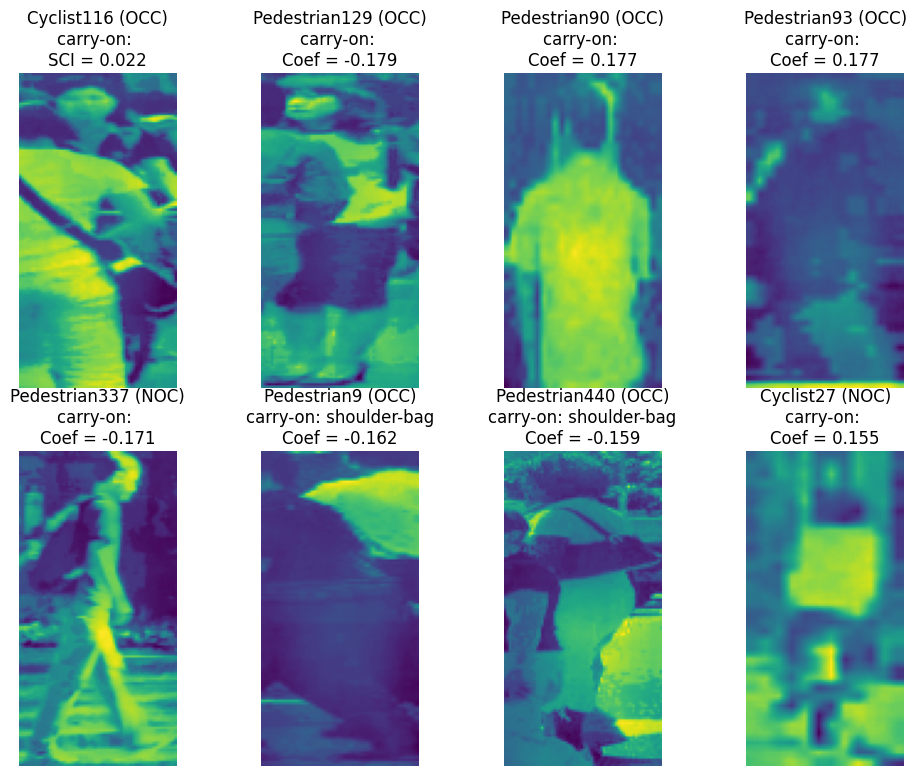

In [125]:
show_topk(30, k=7)

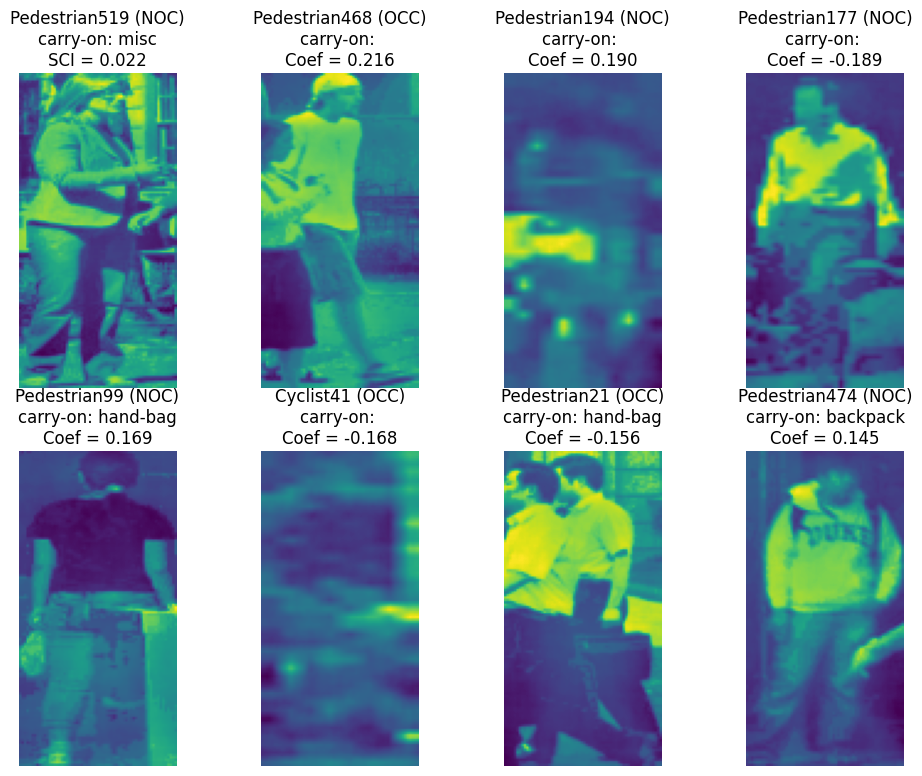

In [126]:
show_topk(97, k=7)

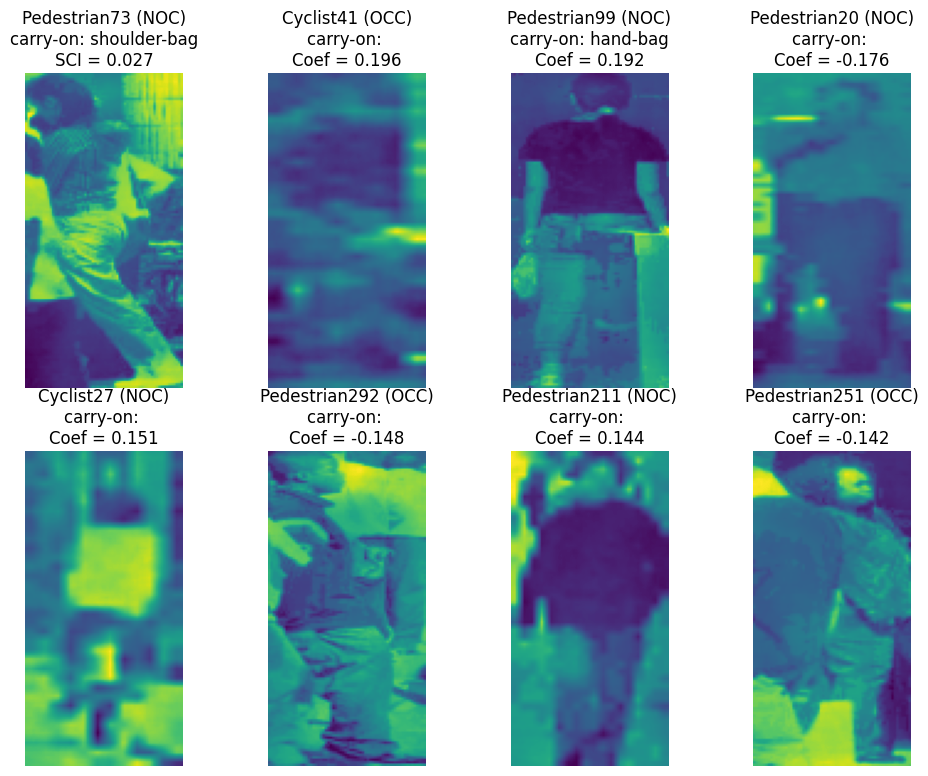

In [127]:
show_topk(14, k=7)

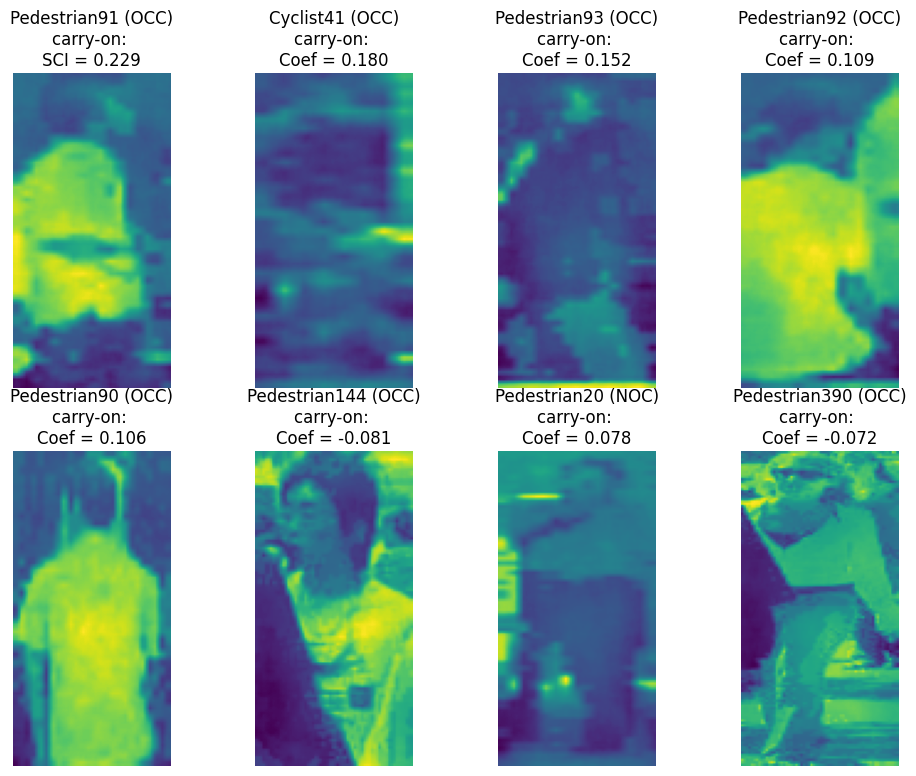

In [128]:
show_topk(20, k=7)

## Predict

### Predicting Types

In [204]:
import pandas as pd
pd.Series(yl[:, 1]).value_counts()

0    311
1     22
2      1
Name: count, dtype: int64

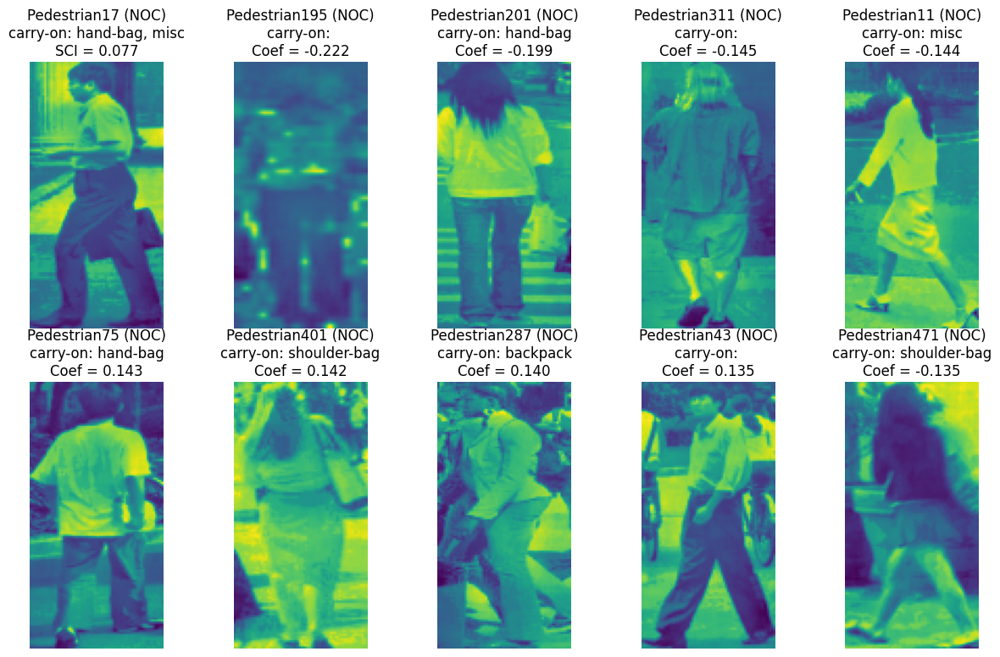

In [205]:
show_topk(15, k=9)

In [206]:
def sigmoid(x):
    return 1/(1 + np.exp(-x))

def softmax(x):
    s = np.exp(x)
    return s / np.sum(s, axis=-1)

def onehot(x, k):
    # x [n]
    x = np.array(x).astype(int)
    if len(x.shape) == 0:
        ret = np.zeros(k)
        ret[x] = 1
    else:
        ret = np.zeros(x.shape[0], k)
        ret[:, x] = 1
    return ret

def crossentropy(p, y):
    # p, y -> [n, k]
    eps = 1e-8
    ret = - np.sum(y * np.log(p + eps))
    if len(y.shape) > 0: ret /= y.shape[0]
    return ret

In [207]:
def predict_type(i, k):
    # Dl -> [n_train, 9]
    # xi -> [n_train]
    xi = np.abs(x[i])
    ids = np.argsort(xi)[-k:]
    xi = xi[ids]
    xi /= np.sum(xi)
    pt = np.zeros(len(TYPES))
    for j in range(len(TYPES)):
        m = Dl[ids, 1] == j
        pt[j] = np.sum(xi[m])
    return pt

i = 15
k = 10
gt = yl[i, 1]
pr = predict_type(i, k)
gt, pr, crossentropy(pr, onehot(gt, len(TYPES)))

(0, array([1., 0., 0.]), -3.3333332964084305e-09)

**Missing all cyclists**

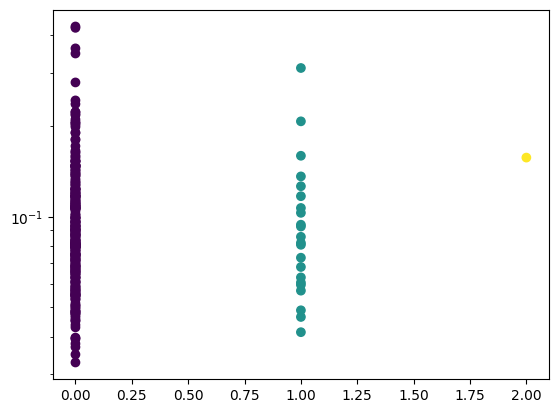

In [210]:
from sklearn.metrics import f1_score, confusion_matrix

gts = yl[:, 1]
scis = sci(xs)

plt.scatter(gts, scis, c=gts)
plt.yscale('log')

### Predicting Occlusions

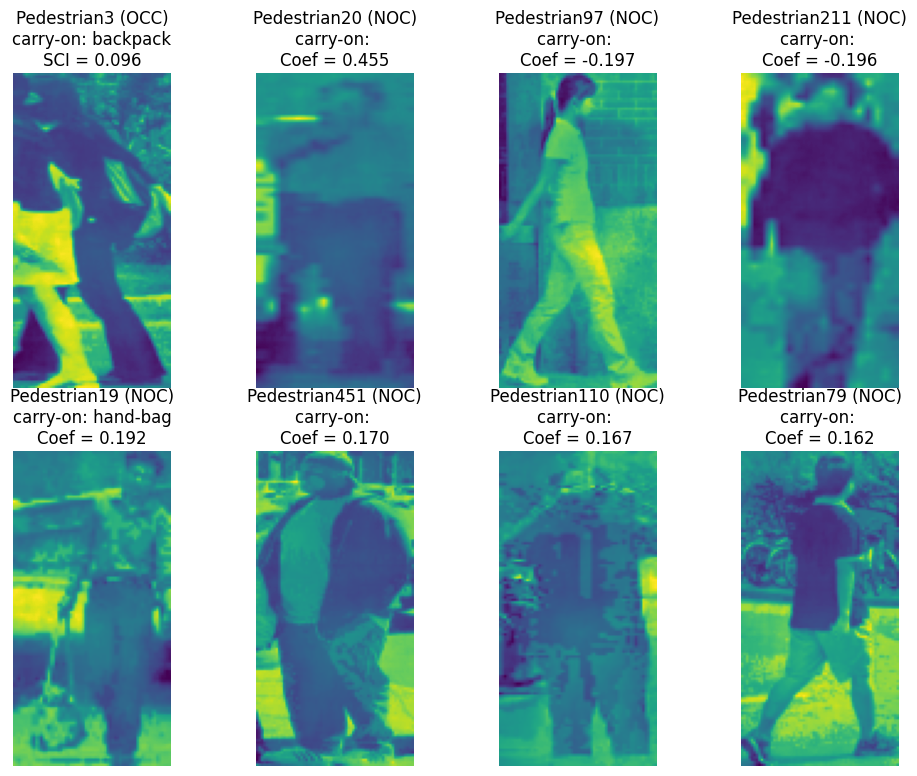

In [222]:
show_topk(3, 7)

In [225]:
def predict_occ(i, k):
    # Dl -> [n_train, 9]
    # xi -> [n_train]
    xi = np.abs(x[i])
    ids = np.argsort(xi)[::-1][:k]
    xi = xi[ids]
    print(Dl[ids, 2], ids)
    occ = np.sum(Dl[ids, 2] * xi)
    return occ# / np.sum(xi)

i = 3
k = 10
gt = yl[i, 2]
pr = predict_occ(i, k)
gt, pr, crossentropy(pr, gt)

[0 0 0 0 0 0 0 0 0 0] [  4  30  73   3 158  37  24 138  15  63]


(1, 0.0, 18.420680743952364)

[0 0 0 0 0 0 0 0 0 0] [  8  37 117  50 139 158  33  61  54 164]
[0 0 0 0 0 0 0 0 0 0] [111  14 158  79 130 139  37   4  63 192]
[0 0 0 0 0 0 0 0 0 0] [ 65  32  30  37 130  33 117 157 187 126]
[0 0 0 0 0 0 0 0 0 0] [  4  30  73   3 158  37  24 138  15  63]
[0 0 0 0 0 0 0 0 0 0] [ 74 108  12 145  80  58 156   0 147 193]
[0 0 0 0 0 0 0 0 0 0] [111  37 165  67 128 168  66 135  34 138]
[0 0 0 0 0 0 0 0 0 0] [  4  29 160   1  50  83  28  63 161 164]
[0 0 0 0 0 0 0 0 0 0] [ 39   4 165   1 107  15  63 117  23  71]
[0 0 0 0 0 0 0 0 0 0] [ 75   4  84 171 184  23  64   1  89 131]
[0 0 0 0 0 0 0 0 0 0] [ 25  73  63 159 158 145  75  58 167   7]
[0 0 0 0 0 0 0 0 0 0] [  4  14 145  57  30  71  56  23 165 130]
[0 0 0 0 0 0 0 0 0 0] [  4  75 145   9 111  84 164  32  14  69]
[0 0 0 0 0 0 0 0 0 0] [ 75   4  74 109  37  34  23 130  20  21]
[0 0 0 0 0 0 0 0 0 0] [ 74 145  66  63 120 117 173  72  14  49]
[0 0 0 0 0 0 0 0 0 0] [ 74  30   4  75 165  93  59 164  31 107]
[0 0 0 0 0 0 0 0 0 0] [ 63  66 111   1  

array([[199,   0],
       [135,   0]])

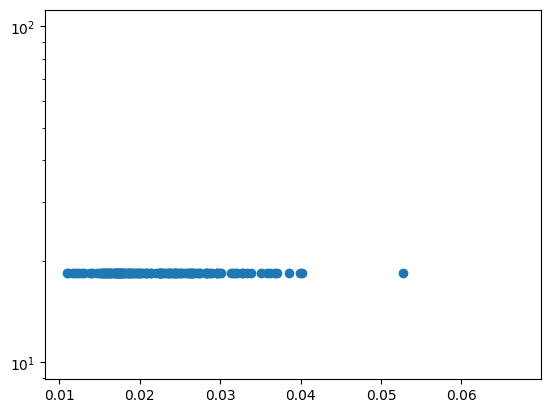

In [224]:
from sklearn.metrics import f1_score, confusion_matrix

prs = []
gts = []
ces = []
scis = sci(x)

for i in range(len(yl)):
    gt = yl[i, 2]
    pr = predict_occ(i, k=10)
    prs.append(np.round(pr))
    gts.append(gt)
    ces.append(crossentropy(pr, gt))

plt.scatter(scis, ces)
plt.yscale('log')
print('Type detection F1 score:', f1_score(gts, prs, average='weighted'))
confusion_matrix(gts, prs)

In [41]:
def predict_topk(i, k):
    ids = np.argsort(x[i])[::-1][:k]
    p = np.median(Dl[ids, 1:], axis=0)
    return p

i = 15
k = 10
yl[i, 1:], predict_topk(i, k)

(array([0, 0, 0, 1, 0, 0, 0, 1]), array([0., 0., 0., 0., 0., 0., 0., 0.]))

In [42]:


def predict_sci(i):
    # Dl -> [n_train, 9]
    # xi -> [n_train]
    xi = np.abs(x[i])
    pt = np.zeros(len(TYPES))
    for j in range(len(TYPES)):
        pt[j] = np.sum(xi[Dl[:, 1] == j])
    da = Dl[:, 2:].T * xi + 1e-8
    return softmax(pt), sci(da)



i = 15
yl[i, 1:], predict_sci(i), crossentropy(i)

(array([0, 0, 0, 1, 0, 0, 0, 1]),
 (array([9.99847843e-01, 9.52326293e-05, 5.69245859e-05]),
  array([0.04180639, 0.05247228, 0.05464414, 0.09585188, 0.99953799,
         0.56036546, 0.08672682])),
 0.6691403284214391)

In [264]:
i = 16
yl[i, 1:], predict_sci(i), crossentropy(i)

(array([0, 0, 0, 1, 0, 0, 0, 0]),
 (array([0.99656728, 0.00233744, 0.00109529]),
  array([2.35359085e-01, 2.28995305e-01, 1.00098553e-01, 1.22403373e-01,
         1.93730192e-17, 8.33531293e-01, 2.11406155e-01])),
 0.2911386358349602)

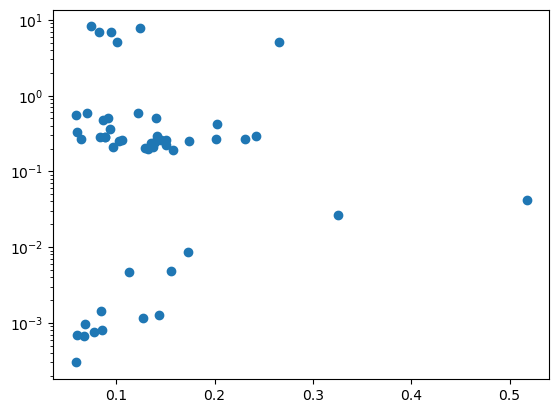

In [267]:
ces = np.array([crossentropy(i) for i in range(len(y))])
plt.scatter(ss, ces)
plt.yscale('log')

### Large

## Torch

In [6]:
class Linear(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.linear = nn.Linear(dim, 1)
    def forward(self, x):
        return self.linear(x.view(-1))

linear = Linear(64 * 32)
linear(y)

Linear(
  (linear): Linear(in_features=2048, out_features=1, bias=True)
)

In [ ]:
def lasso(y, D):
    for e in range(epochs)